# **Building Music Recommendation System using Spotify Dataset**



Hello and welcome , I have created Music Recommendation System using Spotify Dataset. To do this, I presented some of the visualization processes to understand data and done some EDA(Exploratory Data Analysis) so we can select features that are relevant to create a Recommendation System.

# **Importing Libraries**

In [1]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist
import warnings
warnings.filterwarnings("ignore")
from sklearn.impute import SimpleImputer
from sklearn.cluster import KMeans

# **Reading Data**

In [2]:
data=pd.read_csv("/content/data.csv")
artist_data=pd.read_csv("/content/data_by_artist.csv")
genres_data=pd.read_csv("/content/data_by_genres.csv")
year_data=pd.read_csv("/content/data_by_year.csv")
w_genres_data=pd.read_csv("/content/data_w_genres.csv")

# Analysing all Dataset using df.head() and info()

In [3]:
data.head()

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
0,0.0594,1921,0.982,"['Sergei Rachmaninoff', 'James Levine', 'Berli...",0.279,831667,0.211,0,4BJqT0PrAfrxzMOxytFOIz,0.878000,10,0.665,-20.096,1,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",4,1921,0.0366,80.954
1,0.9630,1921,0.732,['Dennis Day'],0.819,180533,0.341,0,7xPhfUan2yNtyFG0cUWkt8,0.000000,7,0.160,-12.441,1,Clancy Lowered the Boom,5,1921,0.4150,60.936
2,0.0394,1921,0.961,['KHP Kridhamardawa Karaton Ngayogyakarta Hadi...,0.328,500062,0.166,0,1o6I8BglA6ylDMrIELygv1,0.913000,3,0.101,-14.850,1,Gati Bali,5,1921,0.0339,110.339
3,0.1650,1921,0.967,['Frank Parker'],0.275,210000,0.309,0,3ftBPsC5vPBKxYSee08FDH,0.000028,5,0.381,-9.316,1,Danny Boy,3,1921,0.0354,100.109
4,0.2530,1921,0.957,['Phil Regan'],0.418,166693,0.193,0,4d6HGyGT8e121BsdKmw9v6,0.000002,3,0.229,-10.096,1,When Irish Eyes Are Smiling,2,1921,0.0380,101.665


In [4]:
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170653 entries, 0 to 170652
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   valence           170653 non-null  float64
 1   year              170653 non-null  int64  
 2   acousticness      170653 non-null  float64
 3   artists           170653 non-null  object 
 4   danceability      170653 non-null  float64
 5   duration_ms       170653 non-null  int64  
 6   energy            170653 non-null  float64
 7   explicit          170653 non-null  int64  
 8   id                170653 non-null  object 
 9   instrumentalness  170653 non-null  float64
 10  key               170653 non-null  int64  
 11  liveness          170653 non-null  float64
 12  loudness          170653 non-null  float64
 13  mode              170653 non-null  int64  
 14  name              170653 non-null  object 
 15  popularity        170653 non-null  int64  
 16  release_date      17

In [5]:
artist_data.head()

,mode,count,acousticness,artists,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,1,9,0.590111,"""Cats"" 1981 Original London Cast",0.467222,250318.555556,0.394003,0.011400,0.290833,-14.448000,0.210389,117.518111,0.389500,38.333333,5
1,1,26,0.862538,"""Cats"" 1983 Broadway Cast",0.441731,287280.000000,0.406808,0.081158,0.315215,-10.690000,0.176212,103.044154,0.268865,30.576923,5
2,1,7,0.856571,"""Fiddler On The Roof” Motion Picture Chorus",0.348286,328920.000000,0.286571,0.024593,0.325786,-15.230714,0.118514,77.375857,0.354857,34.857143,0
3,1,27,0.884926,"""Fiddler On The Roof” Motion Picture Orchestra",0.425074,262890.962963,0.245770,0.073587,0.275481,-15.639370,0.123200,88.667630,0.372030,34.851852,0
4,1,7,0.510714,"""Joseph And The Amazing Technicolor Dreamcoat""...",0.467143,270436.142857,0.488286,0.009400,0.195000,-10.236714,0.098543,122.835857,0.482286,43.000000,5


In [6]:
print(artist_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28680 entries, 0 to 28679
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              28680 non-null  int64  
 1   count             28680 non-null  int64  
 2   acousticness      28680 non-null  float64
 3   artists           28680 non-null  object 
 4   danceability      28680 non-null  float64
 5   duration_ms       28680 non-null  float64
 6   energy            28680 non-null  float64
 7   instrumentalness  28680 non-null  float64
 8   liveness          28680 non-null  float64
 9   loudness          28680 non-null  float64
 10  speechiness       28680 non-null  float64
 11  tempo             28680 non-null  float64
 12  valence           28680 non-null  float64
 13  popularity        28680 non-null  float64
 14  key               28680 non-null  int64  
dtypes: float64(11), int64(3), object(1)
memory usage: 3.3+ MB
None


In [7]:
genres_data.head()

,mode,genres,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,1,21st century classical,0.979333,0.162883,1.602977e+05,0.071317,0.606834,0.361600,-31.514333,0.040567,75.336500,0.103783,27.833333,6
1,1,432hz,0.494780,0.299333,1.048887e+06,0.450678,0.477762,0.131000,-16.854000,0.076817,120.285667,0.221750,52.500000,5
2,1,8-bit,0.762000,0.712000,1.151770e+05,0.818000,0.876000,0.126000,-9.180000,0.047000,133.444000,0.975000,48.000000,7
3,1,[],0.651417,0.529093,2.328809e+05,0.419146,0.205309,0.218696,-12.288965,0.107872,112.857352,0.513604,20.859882,7
4,1,a cappella,0.676557,0.538961,1.906285e+05,0.316434,0.003003,0.172254,-12.479387,0.082851,112.110362,0.448249,45.820071,7


In [8]:
print(genres_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2973 entries, 0 to 2972
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              2973 non-null   int64  
 1   genres            2973 non-null   object 
 2   acousticness      2973 non-null   float64
 3   danceability      2973 non-null   float64
 4   duration_ms       2973 non-null   float64
 5   energy            2973 non-null   float64
 6   instrumentalness  2973 non-null   float64
 7   liveness          2973 non-null   float64
 8   loudness          2973 non-null   float64
 9   speechiness       2973 non-null   float64
 10  tempo             2973 non-null   float64
 11  valence           2973 non-null   float64
 12  popularity        2973 non-null   float64
 13  key               2973 non-null   int64  
dtypes: float64(11), int64(2), object(1)
memory usage: 325.3+ KB
None


In [9]:
year_data.head()

,mode,year,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,1,1921,0.886896,0.418597,260537.166667,0.231815,0.344878,0.205710,-17.048667,0.073662,101.531493,0.379327,0.653333,2
1,1,1922,0.938592,0.482042,165469.746479,0.237815,0.434195,0.240720,-19.275282,0.116655,100.884521,0.535549,0.140845,10
2,1,1923,0.957247,0.577341,177942.362162,0.262406,0.371733,0.227462,-14.129211,0.093949,114.010730,0.625492,5.389189,0
3,1,1924,0.940200,0.549894,191046.707627,0.344347,0.581701,0.235219,-14.231343,0.092089,120.689572,0.663725,0.661017,10
4,1,1925,0.962607,0.573863,184986.924460,0.278594,0.418297,0.237668,-14.146414,0.111918,115.521921,0.621929,2.604317,5


In [10]:
print(year_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              100 non-null    int64  
 1   year              100 non-null    int64  
 2   acousticness      100 non-null    float64
 3   danceability      100 non-null    float64
 4   duration_ms       100 non-null    float64
 5   energy            100 non-null    float64
 6   instrumentalness  100 non-null    float64
 7   liveness          100 non-null    float64
 8   loudness          100 non-null    float64
 9   speechiness       100 non-null    float64
 10  tempo             100 non-null    float64
 11  valence           100 non-null    float64
 12  popularity        100 non-null    float64
 13  key               100 non-null    int64  
dtypes: float64(11), int64(3)
memory usage: 11.1 KB
None


In [11]:
w_genres_data.head()

,genres,artists,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key,mode,count
0,['show tunes'],"""Cats"" 1981 Original London Cast",0.590111,0.467222,250318.555556,0.394003,0.011400,0.290833,-14.448000,0.210389,117.518111,0.389500,38.333333,5,1,9
1,[],"""Cats"" 1983 Broadway Cast",0.862538,0.441731,287280.000000,0.406808,0.081158,0.315215,-10.690000,0.176212,103.044154,0.268865,30.576923,5,1,26
2,[],"""Fiddler On The Roof” Motion Picture Chorus",0.856571,0.348286,328920.000000,0.286571,0.024593,0.325786,-15.230714,0.118514,77.375857,0.354857,34.857143,0,1,7
3,[],"""Fiddler On The Roof” Motion Picture Orchestra",0.884926,0.425074,262890.962963,0.245770,0.073587,0.275481,-15.639370,0.123200,88.667630,0.372030,34.851852,0,1,27
4,[],"""Joseph And The Amazing Technicolor Dreamcoat""...",0.510714,0.467143,270436.142857,0.488286,0.009400,0.195000,-10.236714,0.098543,122.835857,0.482286,43.000000,5,1,7


In [12]:
print(w_genres_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28680 entries, 0 to 28679
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   genres            28680 non-null  object 
 1   artists           28680 non-null  object 
 2   acousticness      28680 non-null  float64
 3   danceability      28680 non-null  float64
 4   duration_ms       28680 non-null  float64
 5   energy            28680 non-null  float64
 6   instrumentalness  28680 non-null  float64
 7   liveness          28680 non-null  float64
 8   loudness          28680 non-null  float64
 9   speechiness       28680 non-null  float64
 10  tempo             28680 non-null  float64
 11  valence           28680 non-null  float64
 12  popularity        28680 non-null  float64
 13  key               28680 non-null  int64  
 14  mode              28680 non-null  int64  
 15  count             28680 non-null  int64  
dtypes: float64(11), int64(3), object(2)
memo

# CHECKING NUMBER OF UNIQUE VALUES IN EACH DATASET

In [13]:
for x in data.columns:
  print(x,':',len(data[x].unique()))
print(data.shape)

valence : 1733
year : 100
acousticness : 4689
artists : 34088
danceability : 1240
duration_ms : 51755
energy : 2332
explicit : 2
id : 170653
instrumentalness : 5401
key : 12
liveness : 1740
loudness : 25410
mode : 2
name : 133638
popularity : 100
release_date : 11244
speechiness : 1626
tempo : 84694
(170653, 19)


In [14]:
for x in artist_data.columns:
  print(x,':',len(artist_data[x].unique()))
print(artist_data.shape)

mode : 2
count : 379
acousticness : 14127
artists : 28680
danceability : 10650
duration_ms : 23960
energy : 12126
instrumentalness : 15517
liveness : 12156
loudness : 21862
speechiness : 10950
tempo : 24801
valence : 11882
popularity : 4663
key : 12
(28680, 15)


In [15]:
for x in genres_data.columns:
  print(x,':',len(genres_data[x].unique()))
print(genres_data.shape)

mode : 2
genres : 2973
acousticness : 2798
danceability : 2725
duration_ms : 2872
energy : 2778
instrumentalness : 2731
liveness : 2709
loudness : 2873
speechiness : 2707
tempo : 2872
valence : 2745
popularity : 2188
key : 12
(2973, 14)


In [16]:
for x in year_data.columns:
  print(x,':',len(year_data[x].unique()))
print(year_data.shape)

mode : 1
year : 100
acousticness : 100
danceability : 100
duration_ms : 100
energy : 100
instrumentalness : 100
liveness : 100
loudness : 100
speechiness : 100
tempo : 100
valence : 100
popularity : 100
key : 7
(100, 14)


In [17]:
for x in w_genres_data.columns:
  print(x,':',len(w_genres_data[x].unique()))
print(w_genres_data.shape)

genres : 10743
artists : 28680
acousticness : 14127
danceability : 10651
duration_ms : 23960
energy : 12125
instrumentalness : 15513
liveness : 12156
loudness : 21862
speechiness : 10949
tempo : 24801
valence : 11878
popularity : 4663
key : 12
mode : 2
count : 379
(28680, 16)


# **Data Understanding by Visualization and EDA**

In [18]:
top10_popular_artists = artist_data.nlargest(10, 'popularity')
top10_most_song_produced_artists = artist_data.nlargest(10, 'count')
print('Top 10 Artists that produced most songs:')
top10_most_song_produced_artists[['count','artists']].sort_values('count',ascending=False)

Top 10 Artists that produced most songs:


,count,artists
8367,3169,Francisco Canaro
28561,2422,Эрнест Хемингуэй
28560,2136,Эрих Мария Ремарк
8434,1459,Frank Sinatra
10714,1256,Ignacio Corsini
27109,1200,Vladimir Horowitz
1682,1146,Arturo Toscanini
2707,1103,Billie Holiday
12378,1061,Johnny Cash
7426,1023,Elvis Presley


In [19]:
print('Top 10 Artists that had most popularity score:')
top10_popular_artists[['popularity','artists']].sort_values('popularity',ascending=False)

Top 10 Artists that had most popularity score:


,popularity,artists
20966,93.0,Ritt Momney
14354,92.0,Lele Pons
15070,90.0,Los Legendarios
11764,89.0,Jerry Di
7463,88.0,Emilee
23687,88.0,Surf Mesa
28263,88.0,salem ilese
213,87.0,A7S
2343,86.0,Beltito
14378,86.0,Lenny Santos


**Conclusions from EDA**

* Most of the songs range between 1950s-2010s.
* Energy in songs have increased over the time.
* Acousticness in songs have reduced greately over the decades.
* We can clearly see that loudness has dominantly increased over the decades and is at it's peak in 2020.
* In top 10 genres we can see that energy and dancebility are most noticable features.

# **Music Over Time**

Using the data grouped by year, we can understand how the overall sound of music has changed from 1921 to 2020.

<Axes: xlabel='decade', ylabel='count'>

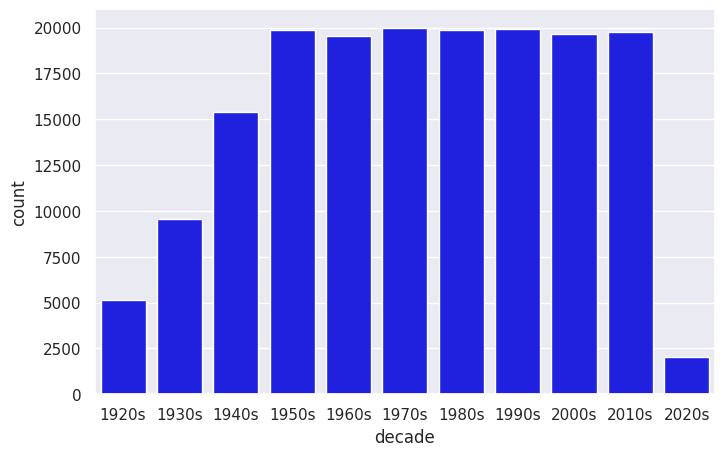

In [20]:
data['decade'] = data['year'].apply(lambda year : f'{(year//10)*10}s')
data['decade'] = pd.Categorical(data['decade'])
sns.set(rc={'figure.figsize':(8 ,5)})
sns.countplot(data=data, x='decade',color="blue")


In [21]:

sound_features = ['valence','acousticness','instrumentalness', 'danceability', 'energy',  'liveness','speechiness']
fig = px.line(year_data, x='year', y=sound_features,title=' Various sound features over decades', line_shape='hv')
fig.show()


# **Characteristics of Different Genres**

This dataset contains the audio features for different songs along with the audio features for different genres. We can use this information to compare different genres and understand their unique differences in sound.

In [22]:
top10_genres = genres_data.nlargest(10, 'popularity')

fig = px.bar(top10_genres, x='genres', y=['acousticness','liveness','valence', 'energy', 'danceability' ], barmode='group')
fig.show()

In [23]:
fig = px.line(year_data, x='year', y='loudness',title='Loudness over decades')
fig.show()

**Below is a word cloud visualization based on the text data in the 'genres' column of the DataFrame genres_data. Words that appear more frequently in the 'genres' column will be displayed larger in the word cloud.**

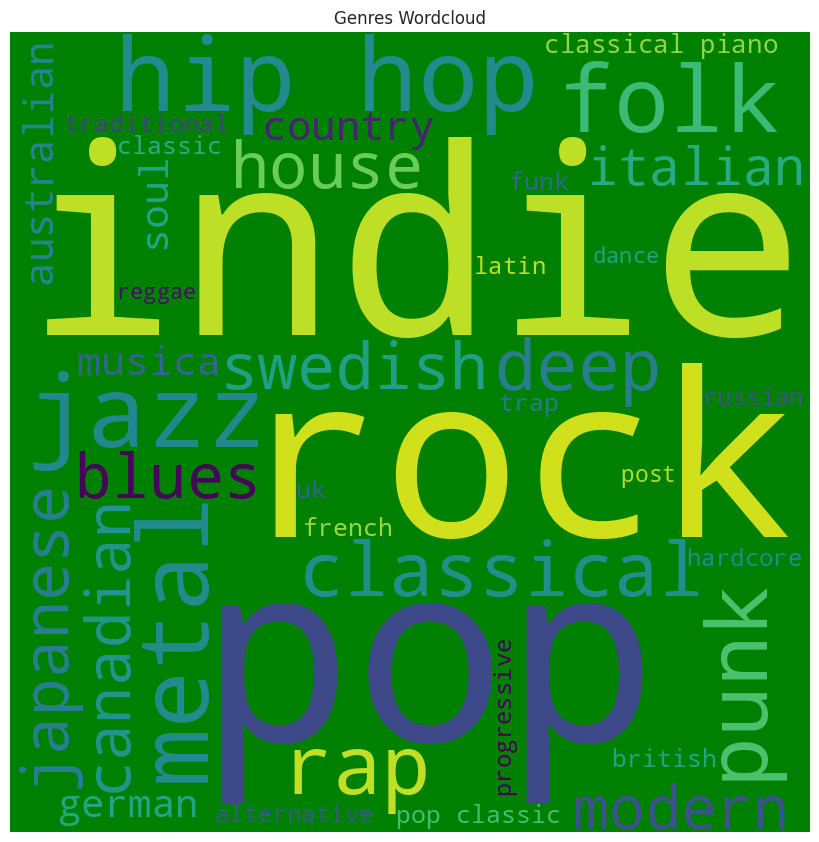

In [24]:
from wordcloud import WordCloud,STOPWORDS

stopwords = set(STOPWORDS)
comment_words = " ".join(genres_data['genres'])+" "
wordcloud = WordCloud(width =
                      800, height = 800,
                background_color ='green',
                stopwords = stopwords,
                max_words=40,
                min_font_size = 10).generate(comment_words)

plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.title("Genres Wordcloud")
plt.show()

**Below is a word cloud visualization for the 'artists' column in the DataFrame artist_data, where the size of each artist's name in the word cloud is determined by its frequency in the dataset. The word cloud provides a visual representation of the most commonly occurring artists in the dataset.**

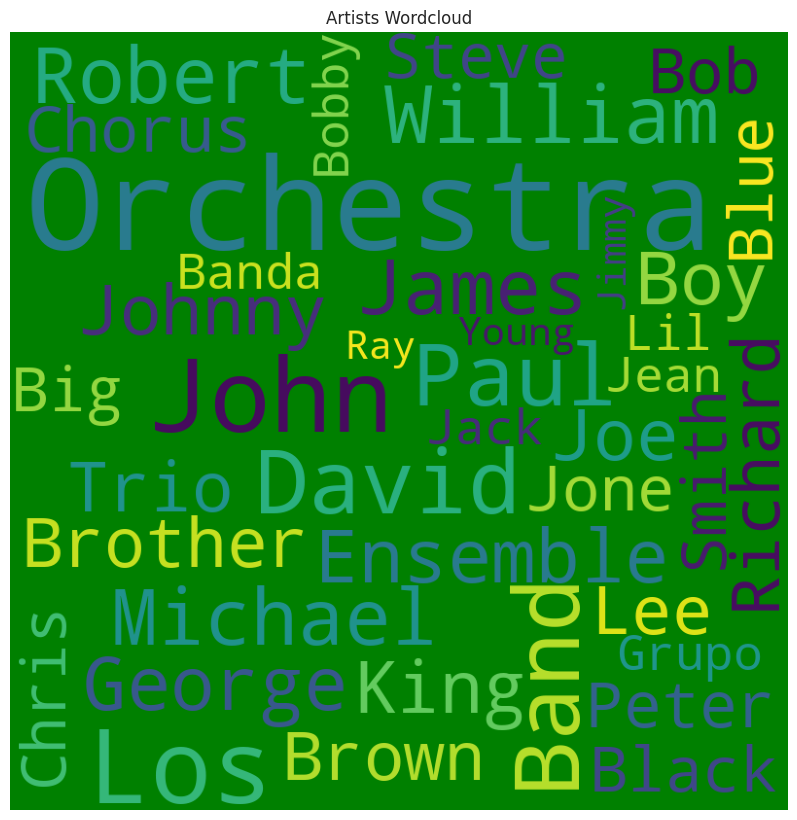

In [25]:

comment_words = " ".join(artist_data['artists'])+" "
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='green',
                stopwords = stopwords,
                min_word_length=3,
                max_words=40,
                min_font_size = 10).generate(comment_words)

plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.title("Artists Wordcloud")
plt.tight_layout(pad = 0)
plt.show()


# **Clustering Genres with K-Means**

Using the K-means clustering algorithm, we organize genres in the dataset into 12 clusters based on the numerical audio features specific to each genre.

In [26]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

cluster_pipeline = Pipeline([('scaler', StandardScaler()), ('kmeans', KMeans(n_clusters=10))])
X = genres_data.select_dtypes(np.number)
cluster_pipeline.fit(X)
genres_data['cluster'] = cluster_pipeline.predict(X)

**Employing t-SNE for Cluster Visualization: t-distributed Stochastic Neighbor Embedding (t-SNE) is an unsupervised machine learning algorithm that has gained widespread popularity in bioinformatics and data science. Its primary utility lies in visualizing the structure of high-dimensional data in two or three dimensions. While t-SNE serves as a dimensionality reduction technique, its predominant use is for visualization rather than data preprocessing. Consequently, dimensionality is typically reduced to two when utilizing t-SNE, facilitating the visualization of data in a two-dimensional plot**







In [27]:
# Visualizing the Clusters with t-SNE
tsne_pipeline = Pipeline([('scaler', StandardScaler()), ('tsne', TSNE(n_components=2, verbose=1))])
genres_embedding = tsne_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=genres_embedding)
projection['genres'] = genres_data['genres']
projection['cluster'] = genres_data['cluster']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'genres'],color_continuous_scale='magenta')
fig.show()

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2973 samples in 0.009s...
[t-SNE] Computed neighbors for 2973 samples in 0.602s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2973
[t-SNE] Computed conditional probabilities for sample 2000 / 2973
[t-SNE] Computed conditional probabilities for sample 2973 / 2973
[t-SNE] Mean sigma: 0.777516
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.106194
[t-SNE] KL divergence after 1000 iterations: 1.393935


# **Clustering Songs with K-Means**

Principal Component Analysis (PCA) is an unsupervised learning algorithm employed for dimensionality reduction in machine learning. A key distinction between PCA and t-SNE lies in their preservation approaches: while t-SNE maintains local similarities, PCA focuses on preserving large pairwise distances to maximize variance. PCA takes a set of points in high-dimensional data and transforms it into low-dimensional data."

In [28]:
# Create a pipeline with scaler, imputer, and kmeans
song_cluster_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('imputer', SimpleImputer(strategy='mean')),  # You can change the strategy as needed
    ('kmeans', KMeans(n_clusters=20, verbose=False))
], verbose=False)

# Select numeric columns from the data
X = data.select_dtypes(np.number)

# Fit the pipeline
song_cluster_pipeline.fit(X)

# Access the labels_ attribute
song_cluster_labels = song_cluster_pipeline.named_steps['kmeans'].labels_

# Assign the cluster labels to the data
data['cluster_label'] = song_cluster_labels


In [29]:
# Visualizing the Clusters with PCA

from sklearn.decomposition import PCA

pca_pipeline = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components=2))])
song_embedding = pca_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=song_embedding)
projection['title'] = data['name']
projection['cluster'] = data['cluster_label']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'title'],color_continuous_scale='bupu')
fig.show()

# **Build Recommender System**

* Based on the analysis and visualizations, it’s clear that similar genres tend to have data points that are located close to each other while similar types of songs are also clustered together.
* This observation makes perfect sense. Similar genres will sound similar and will come from similar time periods while the same can be said for songs within those genres. We can use this idea to build a recommendation system by taking the data points of the songs a user has listened to and recommending songs corresponding to nearby data points.
* [Spotipy](https://spotipy.readthedocs.io/en/2.16.1/) is a Python client for the Spotify Web API that makes it easy for developers to fetch data and query Spotify’s catalog for songs. You have to install using `pip install spotipy`
* After installing Spotipy, you will need to create an app on the [Spotify Developer’s page](https://developer.spotify.com/) and save your Client ID and secret key.

In [30]:
# installing spotify
!pip install spotipy

In [31]:
#importing necessary libraries and creating find_song function
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
from collections import defaultdict

%env SPOTIPY_CLIENT_ID=c265a743fb0b4ca0b3eb0f6c5225ed1f
%env SPOTIPY_CLIENT_SECRET=6d6dfd102ec44c86926dd81548e70b88

sp = spotipy.Spotify(
    auth_manager=SpotifyClientCredentials(
        client_id=os.environ["SPOTIPY_CLIENT_ID"],
        client_secret=os.environ["SPOTIPY_CLIENT_SECRET"]
    )
)


def find_song(name, year):
    song_data = defaultdict()
    results = sp.search(q= 'track: {} year: {}'.format(name,year), limit=1)
    if results['tracks']['items'] == []:
        return None

    results = results['tracks']['items'][0]
    track_id = results['id']
    audio_features = sp.audio_features(track_id)[0]

    song_data['name'] = [name]
    song_data['year'] = [year]
    song_data['explicit'] = [int(results['explicit'])]
    song_data['duration_ms'] = [results['duration_ms']]
    song_data['popularity'] = [results['popularity']]

    for key, value in audio_features.items():
       song_data[key] = value

    return pd.DataFrame(song_data)

env: SPOTIPY_CLIENT_ID=c265a743fb0b4ca0b3eb0f6c5225ed1f
env: SPOTIPY_CLIENT_SECRET=6d6dfd102ec44c86926dd81548e70b88


# Define find_song Function:
A function named find_song takes two parameters: name (song name) and year (release year).
Inside the function:
* A defaultdict named song_data is created to store song-related information.
* A Spotify API search is performed using sp.search with the provided song name and year.
* If no matching tracks are found, the function returns None.
* If a matching track is found, its details are retrieved, including track ID and audio features.
* The song information is collected in the song_data dictionary.
* The function returns a Pandas DataFrame containing the collected information.

In [32]:
from collections import defaultdict
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist
import difflib

number_cols = ['valence', 'year', 'acousticness', 'danceability', 'duration_ms', 'energy', 'explicit',
 'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'popularity', 'speechiness', 'tempo']


def get_song_data(song, spotify_data):

    try:
        song_data = spotify_data[(spotify_data['name'] == song['name'])
                                & (spotify_data['year'] == song['year'])].iloc[0]
        return song_data

    except IndexError:
        return find_song(song['name'], song['year'])

def get_mean_vector(song_list, spotify_data):

    song_vectors = []

    for song in song_list:
        song_data = get_song_data(song, spotify_data)
        if song_data is None:
            print('Warning: {} does not exist in Spotify or in database'.format(song['name']))
            continue
        song_vector = song_data[number_cols].values
        song_vectors.append(song_vector)

    song_matrix = np.array(list(song_vectors))
    return np.mean(song_matrix, axis=0)

def flatten_dict_list(dict_list):

    flattened_dict = defaultdict()
    for key in dict_list[0].keys():
        flattened_dict[key] = []

    for dictionary in dict_list:
        for key, value in dictionary.items():
            flattened_dict[key].append(value)

    return flattened_dict


def recommend_songs( song_list, spotify_data, n_songs=10):

    metadata_cols = ['name', 'year', 'artists']
    song_dict = flatten_dict_list(song_list)

    song_center = get_mean_vector(song_list, spotify_data)
    scaler = song_cluster_pipeline.steps[0][1]
    scaled_data = scaler.transform(spotify_data[number_cols])
    scaled_song_center = scaler.transform(song_center.reshape(1, -1))
    distances = cdist(scaled_song_center, scaled_data, 'cosine')
    index = list(np.argsort(distances)[:, :n_songs][0])

    rec_songs = spotify_data.iloc[index]
    rec_songs = rec_songs[~rec_songs['name'].isin(song_dict['name'])]
    return rec_songs[metadata_cols].to_dict(orient='records')

# get_song_data Function:
* Returns information about the song from spotify_data if found.
* If the song is not found, it calls a function find_song with the song's name and year.

# get_mean_vector Function:
* Computes the mean vector of the song features for the given list of songs.

# flatten_dict_list Function:
Flattens the list of dictionaries into a defaultdict where keys are column names and values are lists of corresponding values.

# recommend_songs Function:
* Recommends songs based on similarity to the input songs.
* Uses cosine distance to measure similarity.
* Returns a list of dictionaries containing recommended song metadata.

# **Song Recommender User Interface**

This code provides a simple user interface for recommending songs based on user input. It utilizes the `ipywidgets` library for creating interactive widgets within Google colab environment.

In [33]:
import ipywidgets as widgets
from IPython.display import display, HTML

def recommend_songs_ui(b):
    song_name = entry_name.value
    song_year = entry_year.value

    song_list = [{'name': song_name, 'year': int(song_year)}]

    recommended_songs = recommend_songs(song_list, data)

    result_html = "<b>Recommended Songs:</b><br>"
    for song in recommended_songs:
        artists = ", ".join(eval(song['artists'])) if 'artists' in song else 'Unknown Artists'
        result_html += f"{song['name']} ({song['year']}) by {artists}<br>"

    result_text.value = result_html

# Create widgets
entry_name = widgets.Text(description="Enter the name of the song:")
entry_year = widgets.Text(description="Enter the year of the song:")
button_recommend = widgets.Button(description="Recommend Songs")
result_text = widgets.HTML(value="")

# Set up event handlers
button_recommend.on_click(recommend_songs_ui)

# Display widgets
display(entry_name, entry_year, button_recommend, result_text)


Text(value='', description='Enter the name of the song:')

Text(value='', description='Enter the year of the song:')

Button(description='Recommend Songs', style=ButtonStyle())

HTML(value='')

# Conclusion
We are able to recommend top 10 similar songs to user based on the input. The recommendation is based on similarity of numerical features of the songs. We have calculated the cosine distance and identified the songs with highest similarity.


THANK YOU !!!